In [13]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),3)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images

def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

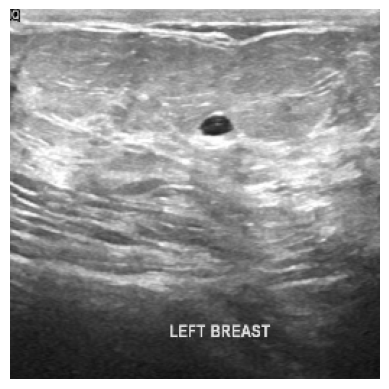

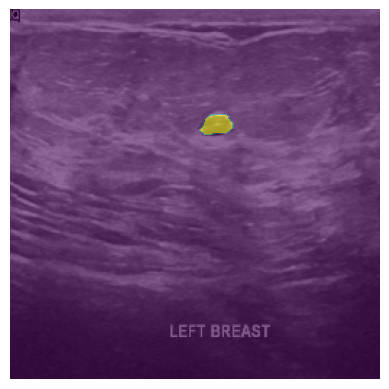

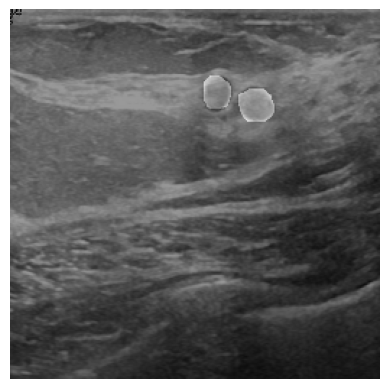

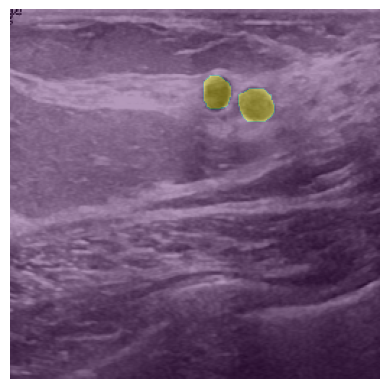

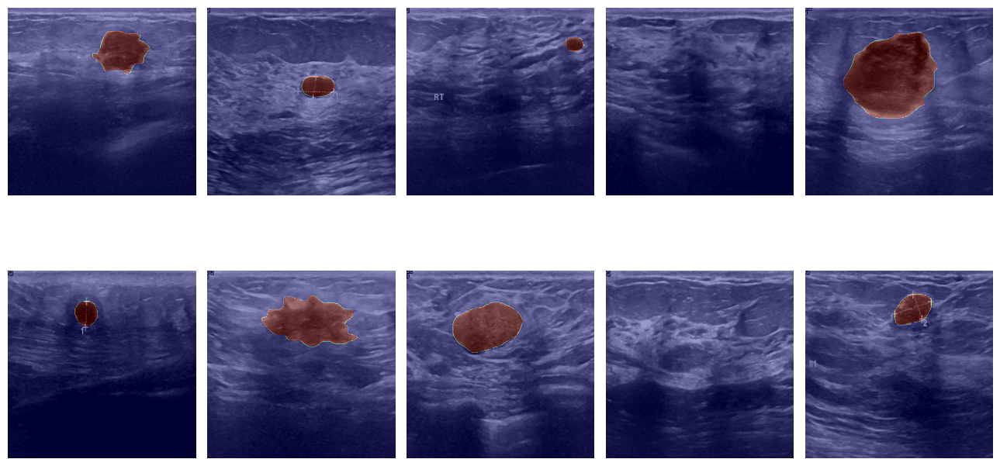

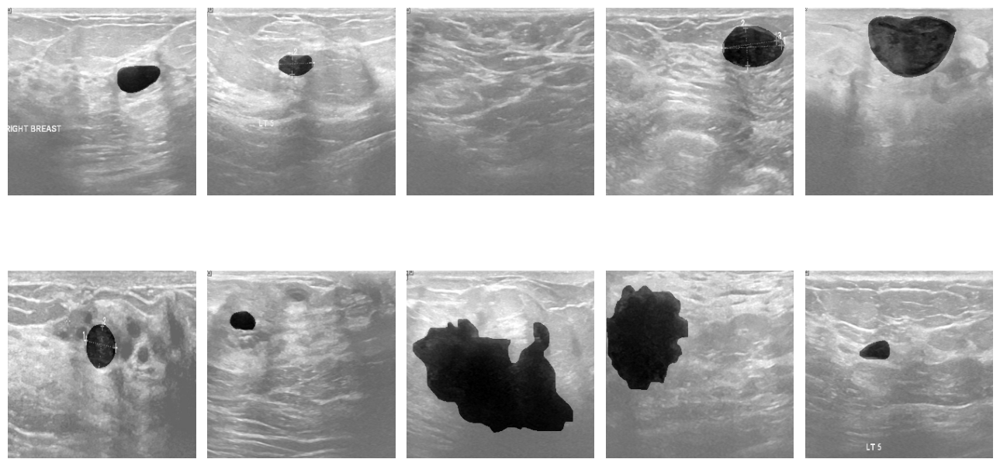

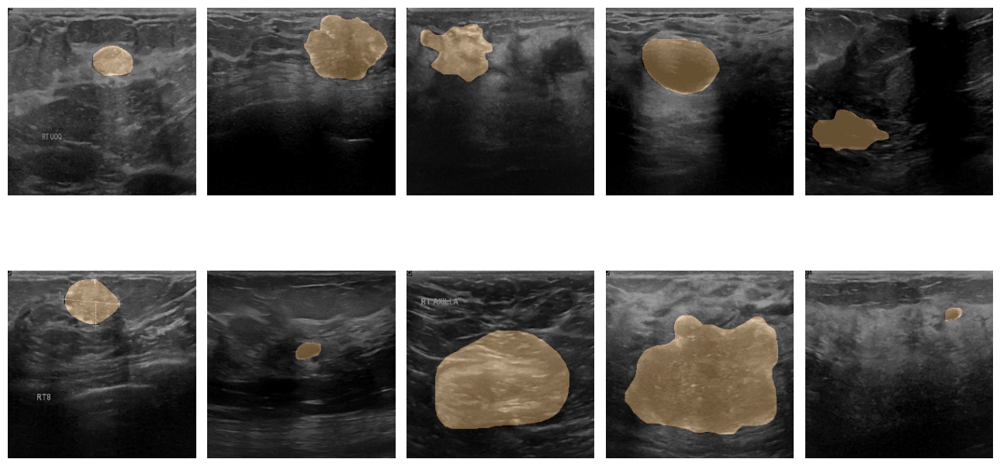

In [14]:
SIZE = 256

root_path = 'Dataset_BUSI_with_GT/'
classes = sorted(os.listdir(root_path))
classes

# Collecting paths and separating based on the classes in the dataset(benign, malignanat, normal)
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])

# Prepping images/masks path to load and view them
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

# Sample image w/ single mask 
show_image(load_image(image_paths[0], SIZE))
plt.show()

show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)
plt.show()

img = np.zeros((1,SIZE,SIZE,3))
mask1 = load_image('Dataset_BUSI_with_GT/benign/benign (25)_mask_1.png', SIZE)
mask2 = load_image('Dataset_BUSI_with_GT/benign/benign (25)_mask.png', SIZE)

# Merging masks for image w/ multiple 
img = img + mask1 + mask2
img = img[0,:,:,0]
show_image(img, cmap='binary')
show_image(img)

# Sample image w/ multiple masks in various color maps
show_image(load_image('Dataset_BUSI_with_GT/benign/benign (25).png', SIZE))
plt.imshow(img, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()

show_image(load_image('Dataset_BUSI_with_GT/benign/benign (25).png', SIZE))
plt.imshow(img, alpha=0.4)
plt.axis('off')
plt.show()

#Loading all images and masks
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

# Sample images w/ masks in three color maps
plt.figure(figsize=(13,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

plt.figure(figsize=(13,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

plt.figure(figsize=(13,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

In [16]:
class Encoder(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(Encoder, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

class Decoder(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(Decoder, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = Encoder(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

Epoch 1/18
1/1 [==============================] - 1s 743ms/steposs: 0.2888 - accuracy: 0.8960 - IoU: 0.455


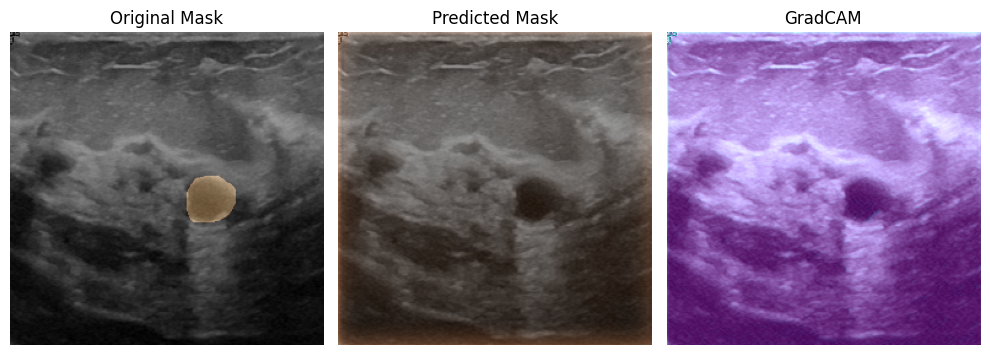

52/52 [==============================] - 1136s 22s/step - loss: 0.2888 - accuracy: 0.8960 - IoU: 0.4556 - val_loss: 0.2758 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 2/18
1/1 [==============================] - 0s 387ms/steposs: 0.2376 - accuracy: 0.9061 - IoU: 0.453


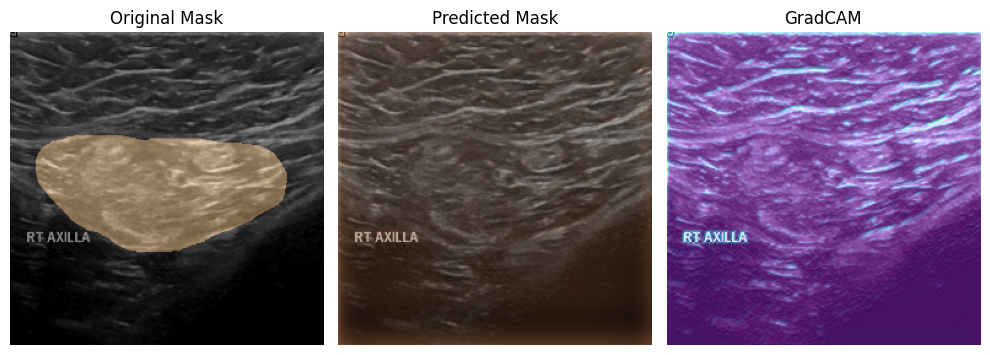

52/52 [==============================] - 1204s 23s/step - loss: 0.2376 - accuracy: 0.9061 - IoU: 0.4535 - val_loss: 0.2819 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 3/18
1/1 [==============================] - 0s 434ms/steposs: 0.2222 - accuracy: 0.9124 - IoU: 0.454


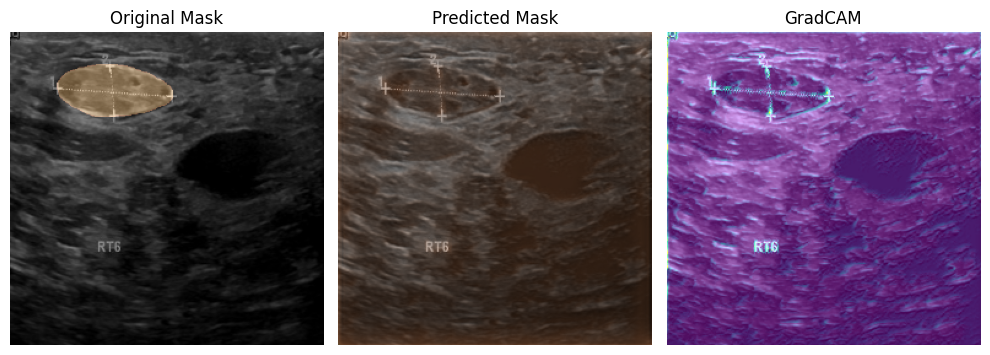

52/52 [==============================] - 1257s 24s/step - loss: 0.2222 - accuracy: 0.9124 - IoU: 0.4547 - val_loss: 0.2946 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 4/18
1/1 [==============================] - 0s 369ms/steposs: 0.2027 - accuracy: 0.9230 - IoU: 0.454


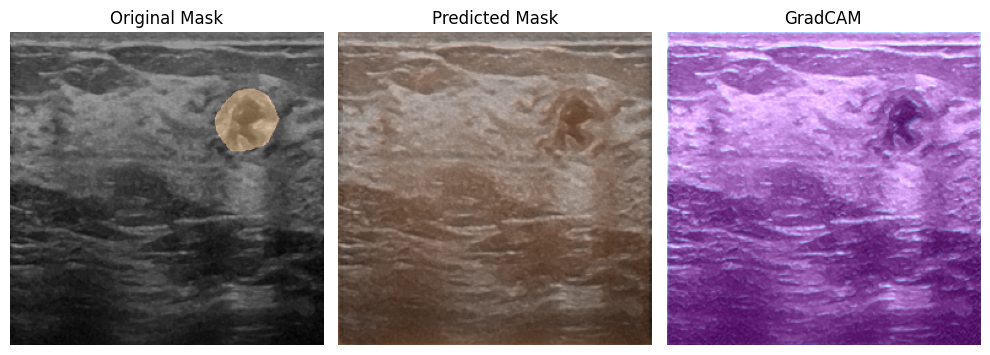

52/52 [==============================] - 1205s 23s/step - loss: 0.2027 - accuracy: 0.9230 - IoU: 0.4547 - val_loss: 0.3007 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 5/18
1/1 [==============================] - 0s 319ms/steposs: 0.2168 - accuracy: 0.9182 - IoU: 0.453


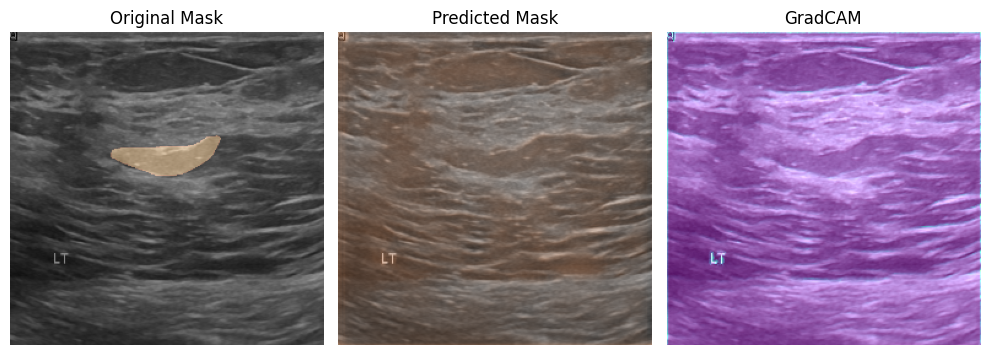

52/52 [==============================] - 1064s 20s/step - loss: 0.2168 - accuracy: 0.9182 - IoU: 0.4535 - val_loss: 0.2160 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 6/18
1/1 [==============================] - 0s 332ms/steposs: 0.1940 - accuracy: 0.9276 - IoU: 0.456


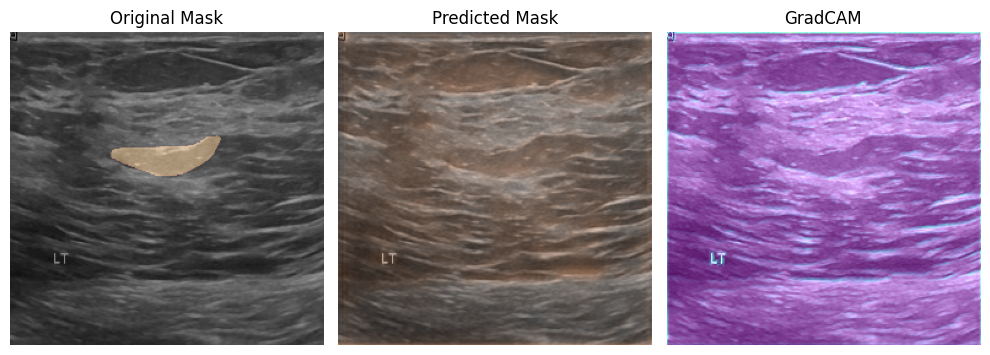

52/52 [==============================] - 1075s 21s/step - loss: 0.1940 - accuracy: 0.9276 - IoU: 0.4568 - val_loss: 0.1628 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 7/18
1/1 [==============================] - 0s 390ms/steposs: 0.1879 - accuracy: 0.9299 - IoU: 0.453


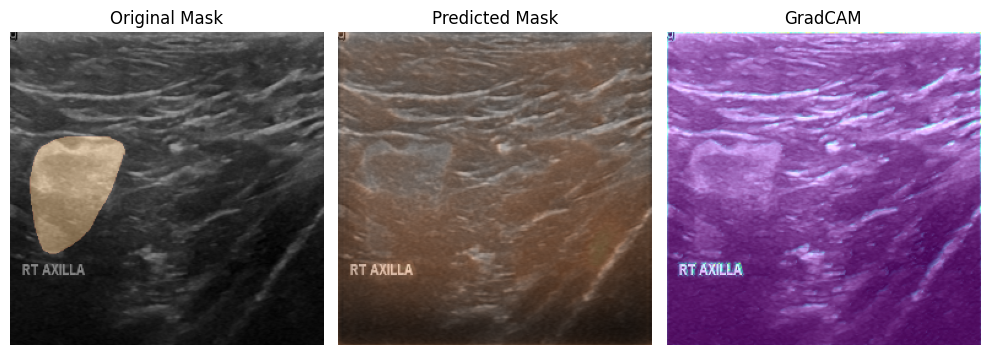

52/52 [==============================] - 1144s 22s/step - loss: 0.1879 - accuracy: 0.9299 - IoU: 0.4537 - val_loss: 0.2376 - val_accuracy: 0.9816 - val_IoU: 0.4909
Epoch 8/18
1/1 [==============================] - 0s 404ms/steposs: 0.1771 - accuracy: 0.9345 - IoU: 0.456


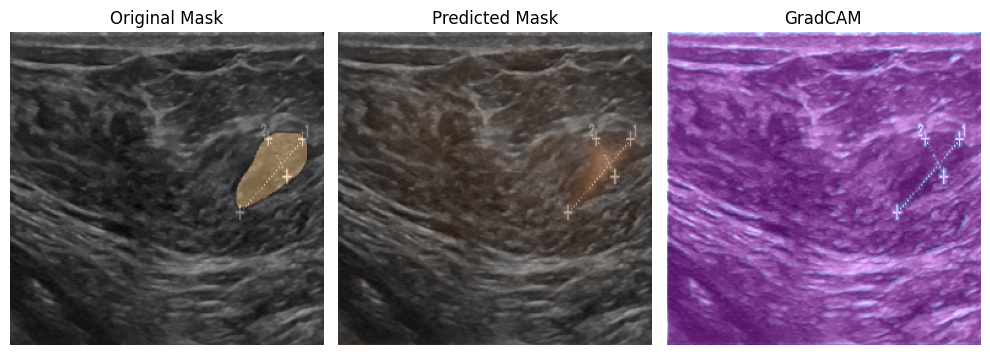

52/52 [==============================] - 1338s 26s/step - loss: 0.1771 - accuracy: 0.9345 - IoU: 0.4567 - val_loss: 0.1029 - val_accuracy: 0.9815 - val_IoU: 0.4909
Epoch 9/18
1/1 [==============================] - 1s 670ms/steposs: 0.1796 - accuracy: 0.9322 - IoU: 0.454


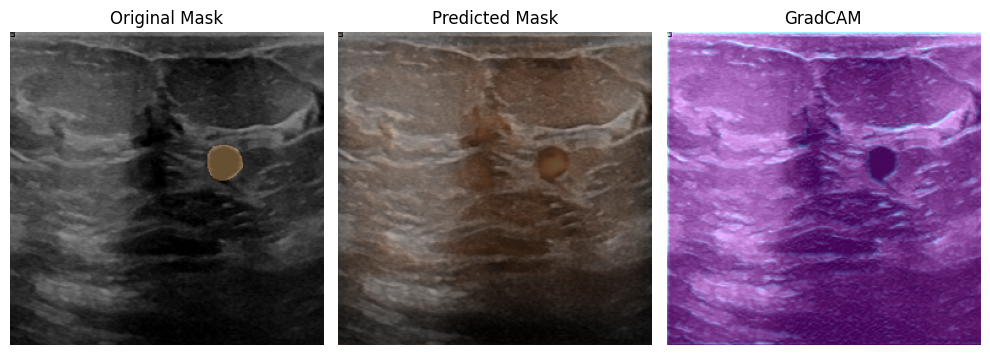

52/52 [==============================] - 2743s 53s/step - loss: 0.1796 - accuracy: 0.9322 - IoU: 0.4547 - val_loss: 0.2002 - val_accuracy: 0.9824 - val_IoU: 0.4909
Epoch 10/18
1/1 [==============================] - 1s 657ms/steposs: 0.1767 - accuracy: 0.9330 - IoU: 0.456


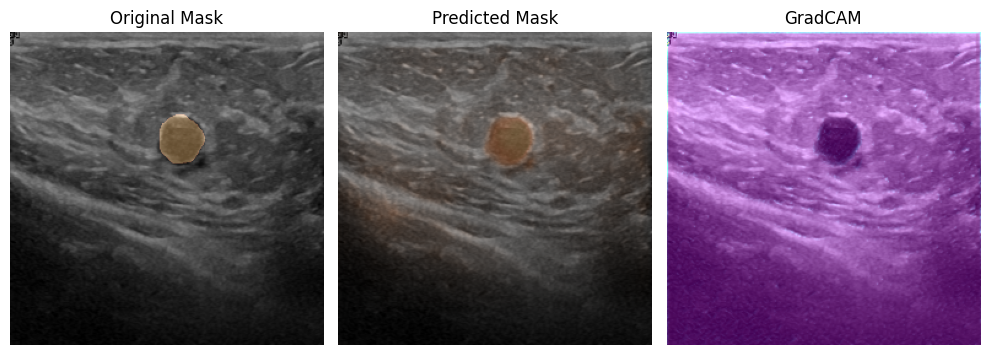

52/52 [==============================] - 1954s 38s/step - loss: 0.1767 - accuracy: 0.9330 - IoU: 0.4569 - val_loss: 0.0877 - val_accuracy: 0.9827 - val_IoU: 0.4909
Epoch 11/18
1/1 [==============================] - 0s 417ms/steposs: 0.1651 - accuracy: 0.9387 - IoU: 0.456


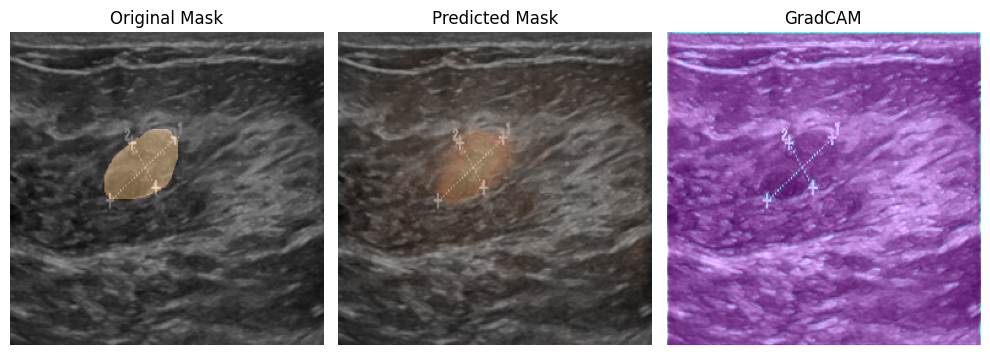

52/52 [==============================] - 2030s 39s/step - loss: 0.1651 - accuracy: 0.9387 - IoU: 0.4563 - val_loss: 0.1125 - val_accuracy: 0.9823 - val_IoU: 0.4909
Epoch 12/18
1/1 [==============================] - 0s 483ms/steposs: 0.1588 - accuracy: 0.9414 - IoU: 0.454


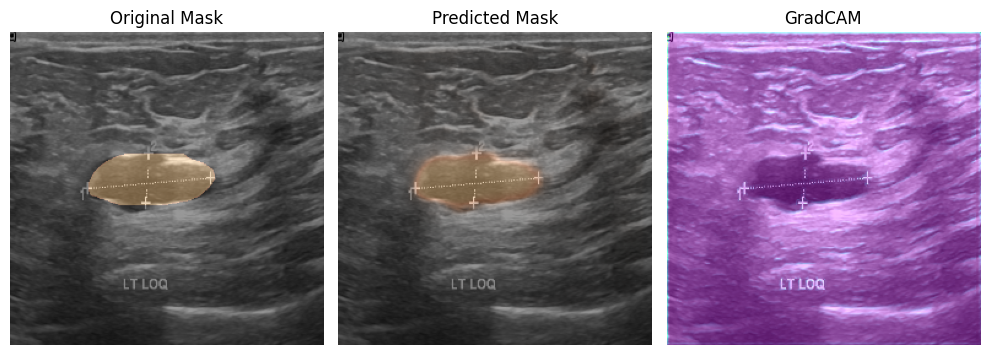

52/52 [==============================] - 1268s 24s/step - loss: 0.1588 - accuracy: 0.9414 - IoU: 0.4540 - val_loss: 0.0846 - val_accuracy: 0.9847 - val_IoU: 0.4909
Epoch 13/18
1/1 [==============================] - 0s 369ms/steposs: 0.1568 - accuracy: 0.9420 - IoU: 0.457


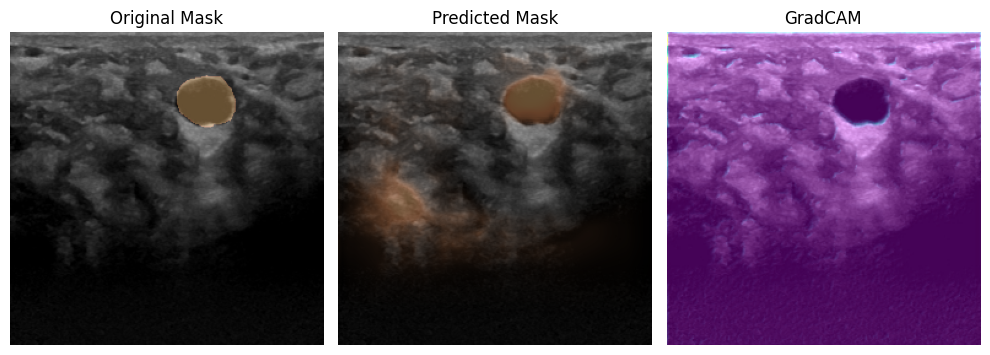

52/52 [==============================] - 1260s 24s/step - loss: 0.1568 - accuracy: 0.9420 - IoU: 0.4575 - val_loss: 0.0839 - val_accuracy: 0.9822 - val_IoU: 0.4909
Epoch 14/18
1/1 [==============================] - 0s 374ms/steposs: 0.1430 - accuracy: 0.9449 - IoU: 0.4557


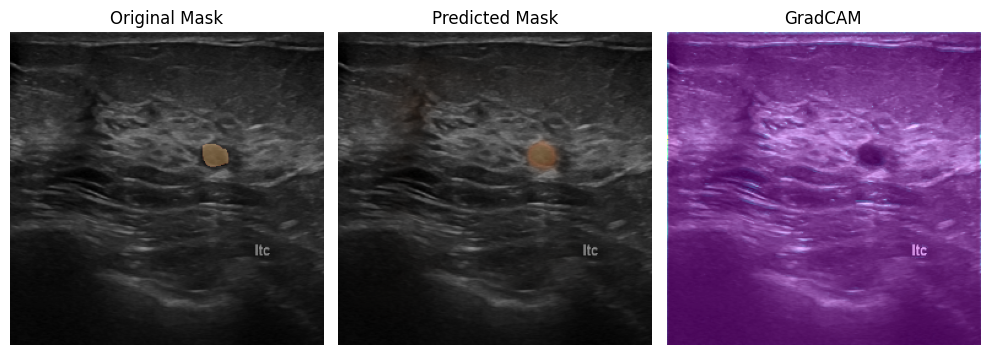

52/52 [==============================] - 8964s 175s/step - loss: 0.1430 - accuracy: 0.9449 - IoU: 0.4557 - val_loss: 0.0640 - val_accuracy: 0.9851 - val_IoU: 0.4909
Epoch 15/18
1/1 [==============================] - 1s 543ms/step


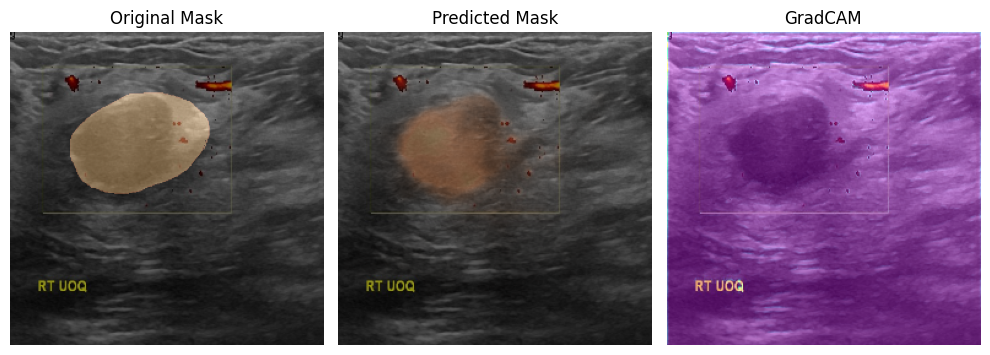

52/52 [==============================] - 942s 18s/step - loss: 0.1400 - accuracy: 0.9461 - IoU: 0.4594 - val_loss: 0.0649 - val_accuracy: 0.9839 - val_IoU: 0.4918


In [17]:
# Images Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = Encoder(32,0.1, name="Encoder1")(input_layer)
p2, c2 = Encoder(64,0.1, name="Encoder2")(p1)
p3, c3 = Encoder(128,0.2, name="Encoder3")(p2)
p4, c4 = Encoder(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = Encoder(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder
a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = Decoder(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = Decoder(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = Decoder(64,0.1, name="Decoder3")([d2, a3])

a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = Decoder(32,0.1, name="Decoder4")([d3, a4])

# Output 
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
#     EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint("AttentionUNetBCUS.h5", save_best_only=True),
    ShowProgress()
]

# Config Training
BATCH_SIZE = 15
SPE = len(images)//BATCH_SIZE

# Training
results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=18, # 15 will be enough for a good Model for better model go with 20+
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

Testing the Model

1/1 [==============================] - 0s 476ms/step


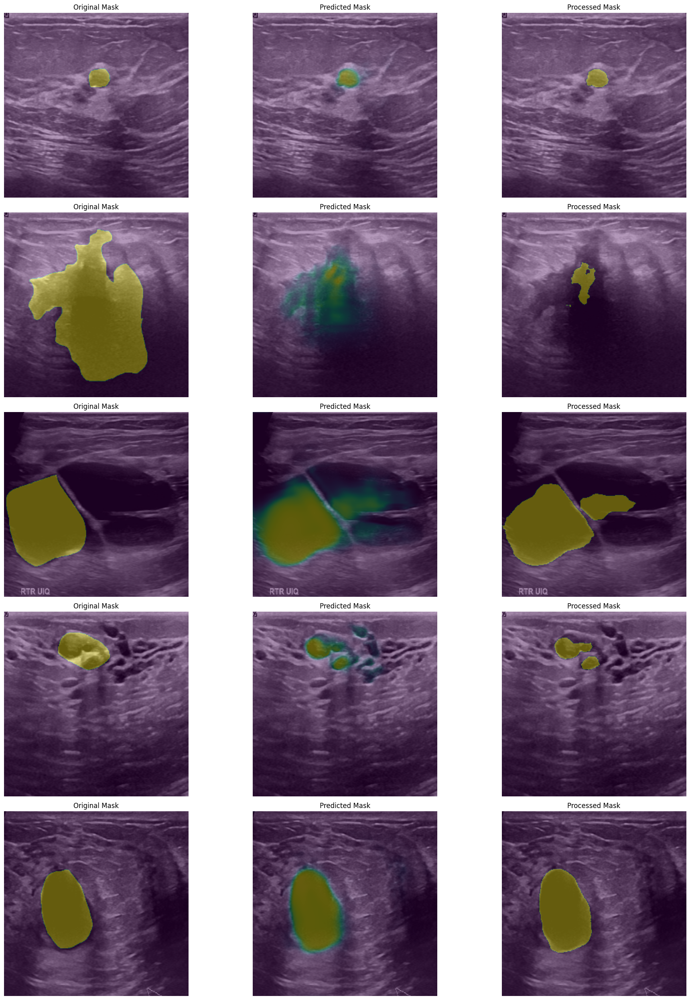

In [18]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()